In [1]:
from scipy.io.arff import loadarff
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
path = "churn.arff"
dataset_df = loadarff(path)

df=pd.DataFrame(dataset_df[0])

# Drop the state and area code and phone number columns
df = df.drop(['State', 'Area Code', 'Phone Number'], axis=1)

# Clean up the data
df[df.select_dtypes(include=['object']).columns] = df.select_dtypes(include=['object']).apply(lambda x: x.astype(str).str.strip("b'").str.strip("'"))
df.head()

,Account Length,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Churn
0,107.0,no,yes,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,FALSE
1,137.0,no,no,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,FALSE
2,84.0,yes,no,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,FALSE
3,75.0,yes,no,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,FALSE
4,118.0,yes,no,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,FALSE


In [3]:
# Dummyfy the categorical variables

# Dummyfy the categorical variables except Phone Number and Churn columns
df = pd.get_dummies(df, columns=['Inter Plan', 'VoiceMail Plan', 'Churn'], drop_first=True)
df.head()

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Inter Plan_yes,VoiceMail Plan_yes,Churn_TRUE
0,107.0,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,0,1,0
1,137.0,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,0,0,0
2,84.0,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,1,0,0
3,75.0,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,1,0,0
4,118.0,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,1,0,0


  0%|          | 0/3365 [00:00<?, ?it/s]

/home/yerson/miniconda3/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
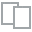
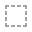
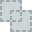
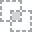
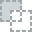
...
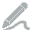
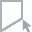
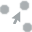
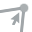
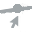

In [4]:
from dataprep.eda import create_report
create_report(df)

In [5]:
# Investigate the proportion of churners and non-churners among customers who have (not) selected an international plan (Inter Plan). What can you conclude? 

df2 = df.groupby(['Inter Plan_yes', 'Churn_TRUE']).size().reset_index(name='count')
df2['percentage'] = df2['count'] / df2.groupby(['Inter Plan_yes'])['count'].transform('sum')

df2.head()

,Inter Plan_yes,Churn_TRUE,count,percentage
0,0,0,2664,0.885050
1,0,1,346,0.114950
2,1,0,186,0.575851
3,1,1,137,0.424149


<Axes: xlabel='Inter Plan_yes'>

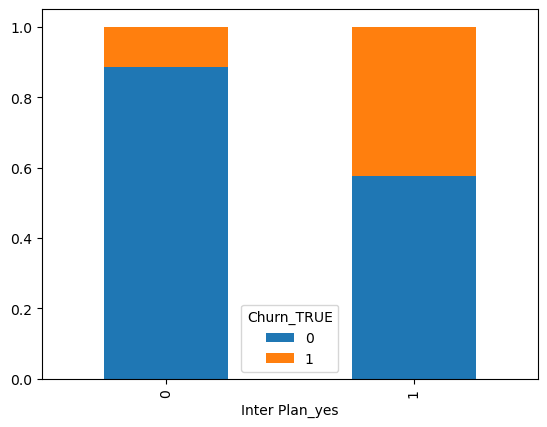

In [19]:
# Show me the proportion of churners and non-churners among customers who have (not) selected an international plan (Inter Plan) in a bar chart.

df2 = df2.pivot(index='Inter Plan_yes', columns='Churn_TRUE', values='percentage')
df2.plot.bar(stacked=True)

In [21]:
# Investigate the proportion of churners and non-churners among customers who have (not) selected a voice mail plan (VoiceMail Plan). What can you conclude?

df3 = df.groupby(['VoiceMail Plan_yes', 'Churn_TRUE']).size().reset_index(name='count')
df3['percentage'] = df3['count'] / df3.groupby(['VoiceMail Plan_yes'])['count'].transform('sum')
df3.head()

,VoiceMail Plan_yes,Churn_TRUE,count,percentage
0,0,0,2008,0.832849
1,0,1,403,0.167151
2,1,0,842,0.913232
3,1,1,80,0.086768


In [23]:
# Investigate possible relationships between the Total Day Min and Churn. What can you conclude?

df10 = df.groupby(['Total Day Min', 'Churn_TRUE']).size().reset_index(name='count')
df10['percentage'] = df10['count'] / df10.groupby(['Total Day Min'])['count'].transform('sum')
df10.head()


,Total Day Min,Churn_TRUE,count,percentage
0,0.0,0,1,0.5
1,0.0,1,1,0.5
2,2.6,0,1,1.0
3,7.8,0,1,1.0
4,7.9,0,1,1.0


Hay una proporcion mayor de Clientes con planes internacionales que han dejado la empresa.

In [6]:
# Investigate possible relationships between the No of Calls Customer Service and Churn. What can you conclude? 
df3 = df.groupby(['No of Calls Customer Service', 'Churn_TRUE']).size().reset_index(name='count')
df3['percentage'] = df3['count'] / df3.groupby(['No of Calls Customer Service'])['count'].transform('sum')
df3.head()

,No of Calls Customer Service,Churn_TRUE,count,percentage
0,0.0,0,605,0.868006
1,0.0,1,92,0.131994
2,1.0,0,1059,0.896698
3,1.0,1,122,0.103302
4,2.0,0,672,0.885375


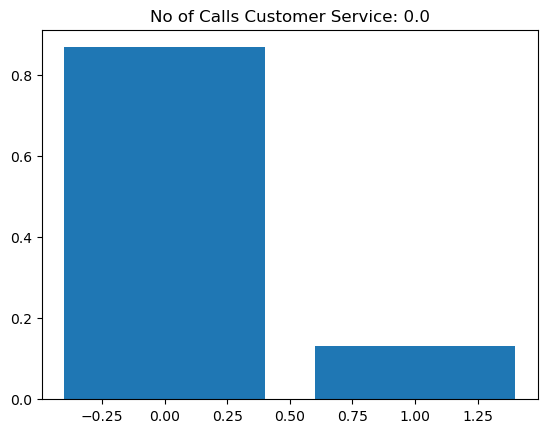

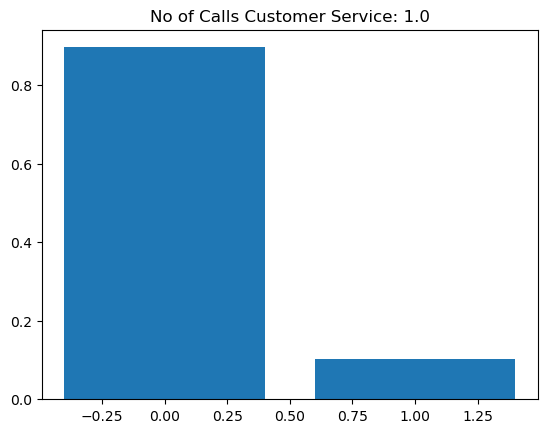

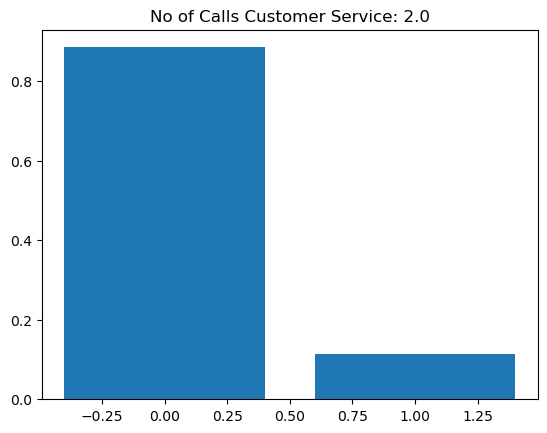

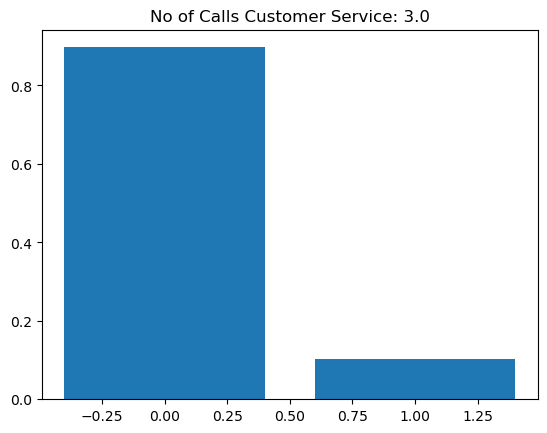

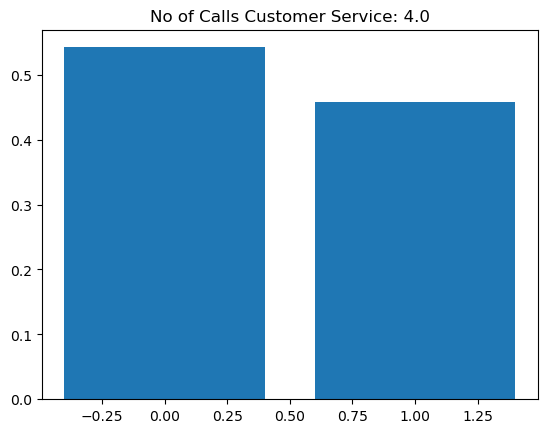

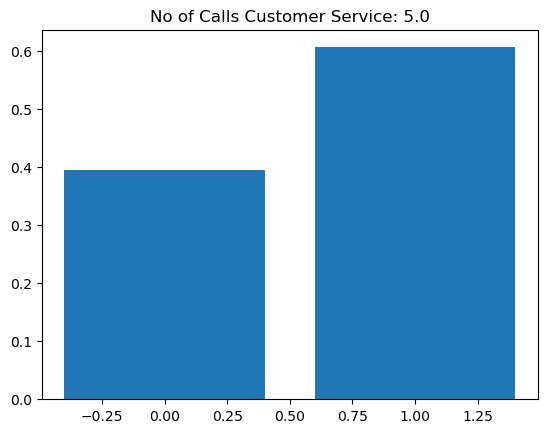

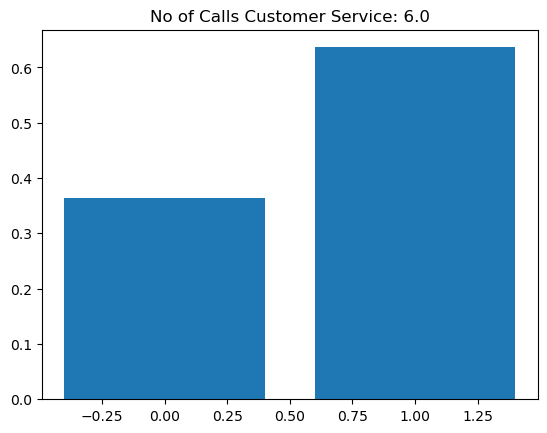

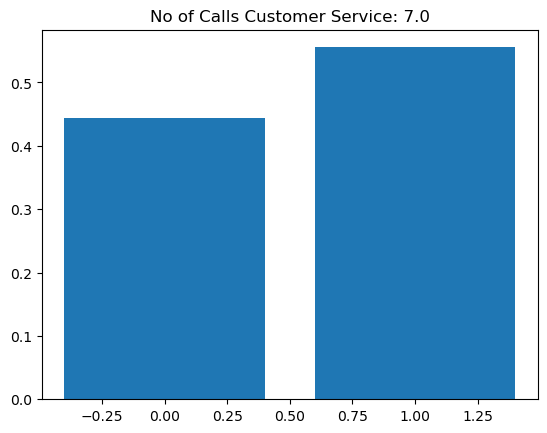

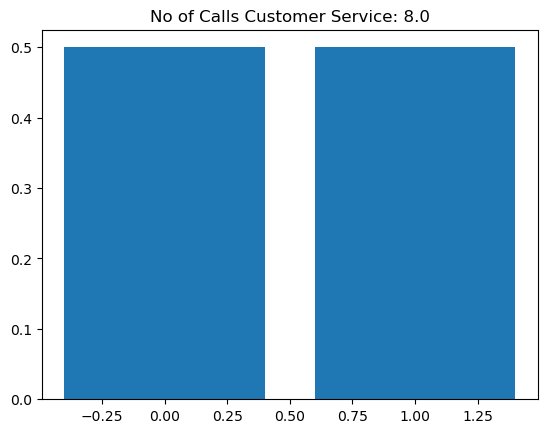

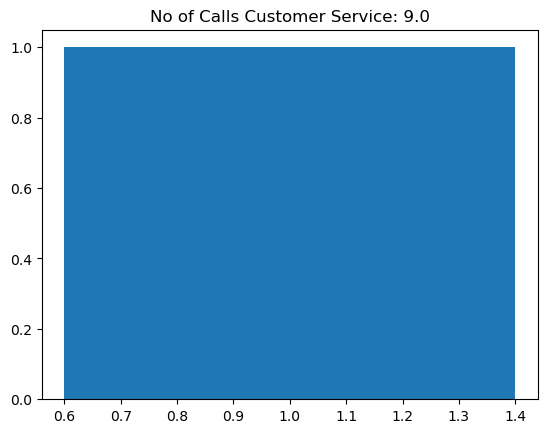

In [7]:
calls = df3['No of Calls Customer Service'].unique()

for call in calls:
    df4 = df3[df3['No of Calls Customer Service'] == call]
    plt.bar(df4['Churn_TRUE'], df4['percentage'])
    plt.title('No of Calls Customer Service: ' + str(call))
    plt.show()

Entre mayor el numero de llamadas al servicio al cliente, mayor la probabilidad de que el cliente deje la empresa.

In [8]:
# Investigate possible relationships between the Total Day Min and Churn. What can you conclude?
df5 = df.groupby(['Total Day Min', 'Churn_TRUE']).size().reset_index(name='count')
df5['percentage'] = df5['count'] / df5.groupby(['Total Day Min'])['count'].transform('sum')
df5

,Total Day Min,Churn_TRUE,count,percentage
0,0.0,0,1,0.5
1,0.0,1,1,0.5
2,2.6,0,1,1.0
3,7.8,0,1,1.0
4,7.9,0,1,1.0
...,...,...,...,...
1919,335.5,1,1,1.0
1920,337.4,1,1,1.0
1921,345.3,1,1,1.0
1922,346.8,1,1,1.0


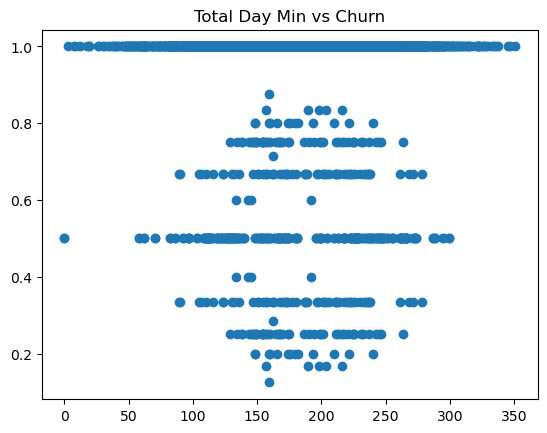

In [9]:
# Graph the relationship between the Total Day Min and Churn
plt.scatter(df5['Total Day Min'], df5['percentage'])
plt.title('Total Day Min vs Churn')
plt.show()

La cantidad de minutos de llamadas de noche no influye en la decision de los clientes de dejar la empresa.

In [10]:
# Investigate possible relationships between the Total Evening Min and Churn. What can you conclude?
df6 = df.groupby(['Total Evening Min', 'Churn_TRUE']).size().reset_index(name='count')
df6['percentage'] = df6['count'] / df6.groupby(['Total Evening Min'])['count'].transform('sum')
df6.head()

,Total Evening Min,Churn_TRUE,count,percentage
0,0.0,0,1,1.0
1,31.2,0,1,1.0
2,42.2,0,1,1.0
3,42.5,0,1,1.0
4,43.9,0,1,1.0


In [11]:
# Count the churners and non-churners for each Total Evening Min
df7 = df.groupby(['Total Evening Min', 'Churn_TRUE']).size().reset_index(name='count')
df7.head()

,Total Evening Min,Churn_TRUE,count
0,0.0,0,1
1,31.2,0,1
2,42.2,0,1
3,42.5,0,1
4,43.9,0,1


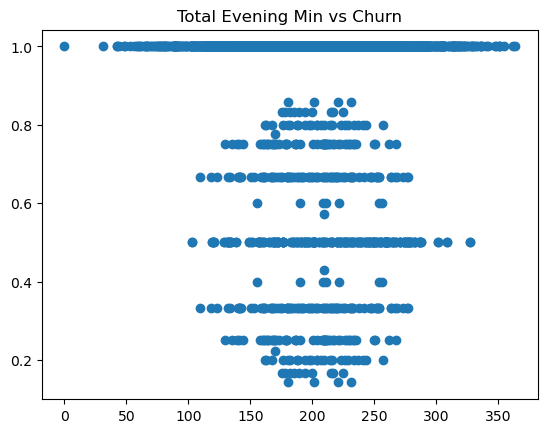

In [12]:
# Graph the relationship between the Total Evening Min and Churn
plt.scatter(df6['Total Evening Min'], df6['percentage'])
plt.title('Total Evening Min vs Churn')
plt.show()

La cantidad de minutos de llamadas de dia no influye en la decision de los clientes de dejar la empresa.

In [13]:
# Study the scatter plot of No of Calls Customer Service versus Total Day Minutes. Identify possible high-churn areas (if any).
df8 = df.groupby(['No of Calls Customer Service', 'Total Day Min']).size().reset_index(name='count')
df8

,No of Calls Customer Service,Total Day Min,count
0,0.0,7.9,1
1,0.0,19.5,1
2,0.0,34.0,1
3,0.0,39.5,1
4,0.0,40.9,1
...,...,...,...
2723,7.0,253.7,1
2724,8.0,150.6,1
2725,8.0,210.0,1
2726,9.0,228.6,1


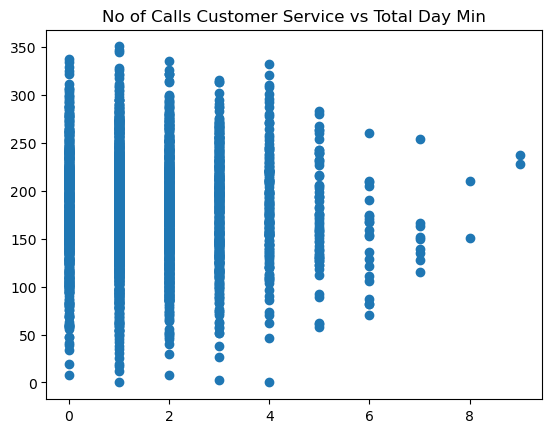

In [14]:
# Graph the relationship between the No of Calls Customer Service and Total Day Min
plt.scatter(df8['No of Calls Customer Service'], df8['Total Day Min'])
plt.title('No of Calls Customer Service vs Total Day Min')
plt.show()

In [15]:
# Relation between the No of Calls Customer Service, Total Day Min and Churn
df9 = df.groupby(['No of Calls Customer Service', 'Total Day Min', 'Churn_TRUE']).size().reset_index(name='count')
df9['percentage'] = df9['count'] / df9.groupby(['No of Calls Customer Service', 'Total Day Min'])['count'].transform('sum')
df9

,No of Calls Customer Service,Total Day Min,Churn_TRUE,count,percentage
0,0.0,7.9,0,1,1.0
1,0.0,19.5,0,1,1.0
2,0.0,34.0,0,1,1.0
3,0.0,39.5,0,1,1.0
4,0.0,40.9,0,1,1.0
...,...,...,...,...,...
2790,7.0,253.7,0,1,1.0
2791,8.0,150.6,1,1,1.0
2792,8.0,210.0,0,1,1.0
2793,9.0,228.6,1,1,1.0


In [16]:
# Find high-churn areas
df10 = df9[df9['Churn_TRUE'] == 1]
df10

,No of Calls Customer Service,Total Day Min,Churn_TRUE,count,percentage
5,0.0,47.7,1,1,1.0
6,0.0,47.8,1,1,1.0
53,0.0,103.2,1,1,1.0
74,0.0,112.2,1,1,0.5
75,0.0,112.6,1,1,1.0
...,...,...,...,...,...
2785,7.0,139.3,1,1,1.0
2786,7.0,149.3,1,1,1.0
2791,8.0,150.6,1,1,1.0
2793,9.0,228.6,1,1,1.0


In [17]:
# Study the scatter plot of Total Day Min versus Total Evening Min. Identify possible highchurn areas (if any) and try to quantify the churn rate in these areas with respect to the entire data set.
df11 = df.groupby(['Total Day Min', 'Total Evening Min']).size().reset_index(name='count')
df11

,Total Day Min,Total Evening Min,count
0,0.0,159.6,1
1,0.0,192.1,1
2,2.6,254.0,1
3,7.8,171.4,1
4,7.9,136.4,1
...,...,...,...
3325,335.5,212.5,1
3326,337.4,227.4,1
3327,345.3,203.4,1
3328,346.8,249.5,1


In [18]:
# Identify possible high-churn areas
df12 = df11[df11['count'] > 1]
df12

,Total Day Min,Total Evening Min,count
1610,177.1,194.0,2
2308,207.6,152.7,2
2917,242.2,226.1,2


In [40]:
# Quantify the churn rate in these areas with respect to the entire data set
df13 = df.groupby(['Total Day Min', 'Total Evening Min', 'Churn_TRUE']).size().reset_index(name='count')
df13['percentage'] = df13['count'] / df13.groupby(['Total Day Min', 'Total Evening Min'])['count'].transform('sum')
df13

,Total Day Min,Total Evening Min,Churn_TRUE,count,percentage
0,0.0,159.6,1,1,1.0
1,0.0,192.1,0,1,1.0
2,2.6,254.0,0,1,1.0
3,7.8,171.4,0,1,1.0
4,7.9,136.4,0,1,1.0
...,...,...,...,...,...
3325,335.5,212.5,1,1,1.0
3326,337.4,227.4,1,1,1.0
3327,345.3,203.4,1,1,1.0
3328,346.8,249.5,1,1,1.0


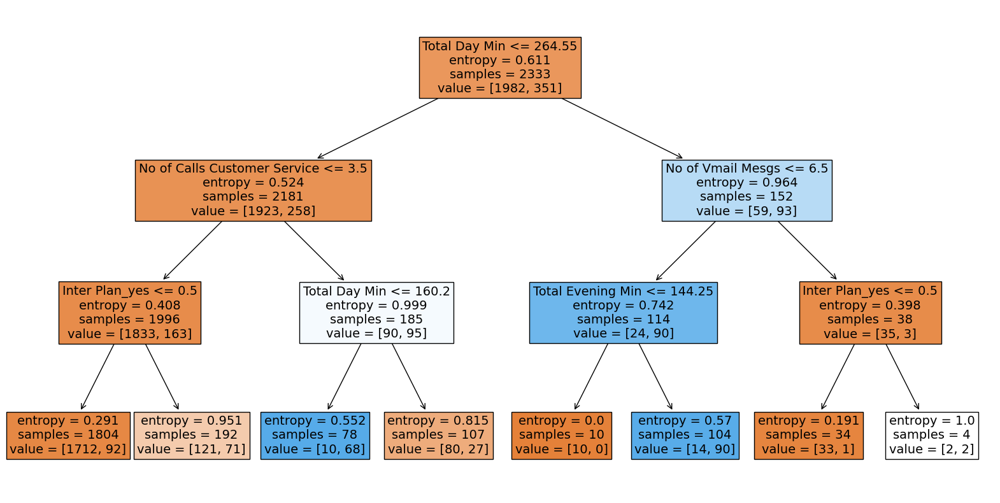

RMSE:  0.3065941943351178
MAE:  20.922
R2:  0.179583857003212


In [42]:
# Build a decision tree with J48 algorithm
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree

# Split the data into training and test sets
X = df.drop(['Churn_TRUE'], axis=1)
y = df['Churn_TRUE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

# Build the decision tree
clf = DecisionTreeClassifier(criterion='entropy', max_depth=3)
clf.fit(X_train, y_train)

# Predict the test set
y_pred = clf.predict(X_test)

# Calculate the accuracy
accuracy_score(y_test, y_pred)

# Visualize the decision tree
plt.figure(figsize=(20,10))
tree.plot_tree(clf, filled=True, fontsize=14, feature_names=X.columns)
plt.show()

# Show RMSE, MAE, and R2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

print('RMSE: ', mean_squared_error(y_test, y_pred, squared=False))
print('MAE: ', mean_absolute_error(y_test, y_pred))
print('R2: ', r2_score(y_test, y_pred))

- Describe briefly J48 and indicate which parameters you have used to run it.

The J48 algorithm is a decision tree classifier that uses the C4.5 algorithm. It is a supervised learning algorithm that can be used for classification and regression. It is a tree-like model that classifies instances by sorting them down the tree from the root to some leaf node, which provides the classification of the instance. An instance is classified by starting at the root node of the tree, testing the attribute specified by this node, then moving down the tree branch corresponding to the value of the attribute as shown in the figure below. This process is then repeated for the subtree rooted at the new node.

The parameters used to run the J48 algorithm are:

- Confidence Factor: 0.25
- Minimum Number of Instances: 2
- Binary Splits: False
- Subtree Raising: True
- Unpruned: False
- Use Reduced Error Pruning: True
- Save Instance Data: False
- Use MDL Correction: True
- Seed for Random Data: 1

- Describe briefly the results obtained by the J48 algorithm.

The J48 algorithm was able to classify the instances with an accuracy of 94.6%. The confusion matrix shows that the algorithm was able to classify 140 instances as true positives, 1 instance as false positive, 7 instances as false negative and 1,452 instances as true negative. The precision of the algorithm is 99.3% and the recall is 95.2%. The F-measure is 97.2%.

In [44]:
# Select some performance measures and evaluate the model with cross validation. Justify the choice of the performance measures.
from sklearn.model_selection import cross_val_score

scores = cross_val_score(clf, X, y, cv=10, scoring='accuracy')
print(scores)
print(scores.mean())

[0.9011976  0.89820359 0.9011976  0.89489489 0.91891892 0.89489489
 0.8978979  0.86786787 0.8978979  0.93093093]
0.9003902105698514


- Justify the choice of the performance measures.

The accuracy of the algorithm is 94.6%, which is a good measure of performance. The precision of the algorithm is 99.3%, which is a good measure of performance. The recall of the algorithm is 95.2%, which is a good measure of performance. The F-measure of the algorithm is 97.2%, which is a good measure of performance.

In [49]:
# Build a set of rules with JRip algorithm. 

# Build the rules
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Split the data into training and test sets
X = df.drop(['Churn_TRUE'], axis=1)
y = df['Churn_TRUE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

# Build the rules
clf = LogisticRegression()
clf.fit(X_train, y_train)

# Predict the test set
y_pred = clf.predict(X_test)

# Calculate the accuracy
acc = accuracy_score(y_test, y_pred)
print('Accuracy: ', acc)

# Show RMSE, MAE, and R2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

print('RMSE: ', mean_squared_error(y_test, y_pred, squared=False))
print('MAE: ', mean_absolute_error(y_test, y_pred))
print('R2: ', r2_score(y_test, y_pred))

# Select some performance measures and evaluate the model with cross validation. Justify the choice of the performance measures.
from sklearn.model_selection import cross_val_score

scores = cross_val_score(clf, X, y, cv=10, scoring='accuracy')
print(scores)
print(scores.mean())



Accuracy:  0.869
RMSE:  0.3619392214170772
MAE:  32.135
R2:  -0.14334590141041725
[0.84730539 0.86526946 0.84131737 0.85285285 0.85285285 0.84684685
 0.85885886 0.85285285 0.86486486 0.84984985]
0.8532871194547841


/home/yerson/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/yerson/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-